###Installing dependencies###

In [ ]:
pwd

'/content'

In [ ]:
cd /content

/content


In [ ]:
mkdir Age_sd_m

In [ ]:
cd Age_sd_m

/content/Age_sd_m


In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 7328, done.
remote: Total 7328 (delta 0), reused 0 (delta 0), pack-reused 7328
Receiving objects: 100% (7328/7328), 8.88 MiB | 22.34 MiB/s, done.
Resolving deltas: 100% (5051/5051), done.
/content/Age_sd_m/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
pwd

'/content/Age_sd_m/yolov5'

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 7.5MB/s 
Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
cd /content/Age_sd_m

/content/Age_sd_m


In [ ]:
!curl -L "https://app.roboflow.com/ds/2NO29FIwzK?key=f5J9mnUcQH" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   895  100   895    0     0   1826      0 --:--:-- --:--:-- --:--:--  1822
100 9114k  100 9114k    0     0  13.1M      0 --:--:-- --:--:-- --:--:-- 13.1M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/0110_jpg.rf.0f50c8f88018350d070366f98106ed5a.jpg  
 extracting: test/images/0111_jpg.rf.59d4202a02da347d4ce521a218b41695.jpg  
 extracting: test/images/0111_jpg.rf.6f07a645e985752108aa699267eea991.jpg  
 extracting: test/images/0113_jpg.rf.ec6005721638c5e148dcb25e21c1c121.jpg  
 extracting: test/images/0117_jpg.rf.5a3e6e3765a4ded27c940a3684569edd.jpg  
 extracting: test/images/0117_jpg.rf.8a093e83bde933408c1978acc4cd20cd.jpg  
 extracting: test/images/0117_jpg.rf.da7b9b36f4d9dced414ace6d203ad4a8.jpg  
 extract

# y([y]es) need to be given if required during runtime

In [ ]:
!curl -L "https://app.roboflow.com/ds/zSJ9WXKGpI?key=HFqkE0q5Qx" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1668      0 --:--:-- --:--:-- --:--:--  1668
100 5988k  100 5988k    0     0  8640k      0 --:--:-- --:--:-- --:--:-- 8640k
Archive:  roboflow.zip
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.roboflow.txt     
replace data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: data.yaml               
 extracting: test/images/0d12df28-6795-4693-95e6-baa3c5c7d14b_jpg.rf.8e4de6bcbb4e0adff580ec1a56a855c1.jpg  
 extracting: test/images/12_jpg.rf.51a1483508008941d240b791033d79e7.jpg  
 extracting: test/images/19a85cc5-9226-4f8a-841c-1e05bd8340db_jpg.rf.fa916140734ca6f08798dfec0621df33.jpg  
 extracting: test/images/2b5b6032-b30d-4e88-a888-81aa8b7cd480_jpg.rf.2b294b701af0092190a577082250a405.jpg  
 extracting: test/images/2b7d3151-a306-4590-9687-517b41d8e0

In [ ]:
pwd

'/content/Age_sd_m'

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 5
names: ['blackspot', 'darkspot', 'puffyeye', 'puffyeyes', 'wrinkle']

###Define Model COnfiguration And architecture###

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat ./yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate ./yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Here epochs is 20 give 2000 while evaluation for better results

In [ ]:
# train yolov5s on custom data for 20 epochs
# time its performance
%%time
%cd ./yolov5/
!python train.py --img 416 --batch 16 --epochs 20 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

[Errno 2] No such file or directory: './yolov5/'
/content/Age_sd_m/yolov5
github: ⚠️ WARNING: code is out of date by 301 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=20, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb

###Some Analysis of model###

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
pwd

'/content/Age_sd_m/yolov5'

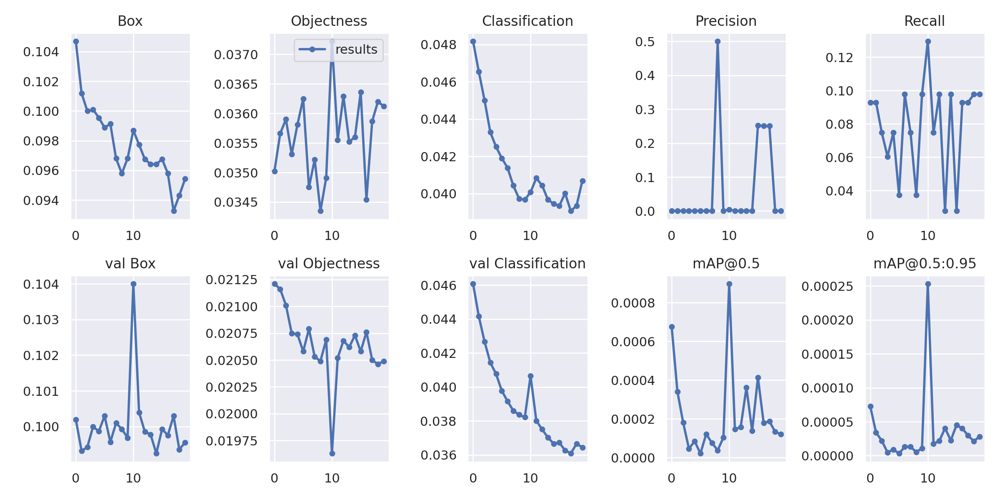

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='./runs/train/yolov5s_results2/results.png', width=1000)

GROUND TRUTH TRAINING DATA:


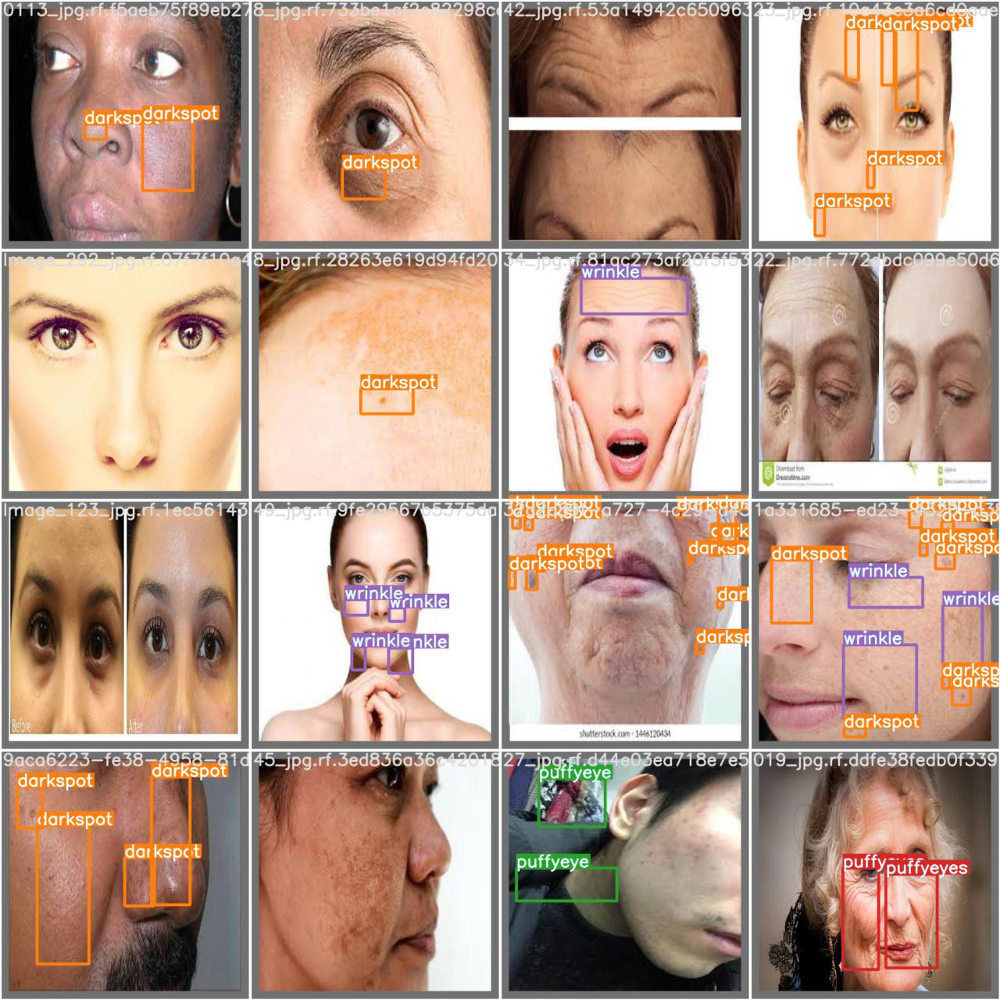

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='./runs/train/yolov5s_results2/test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


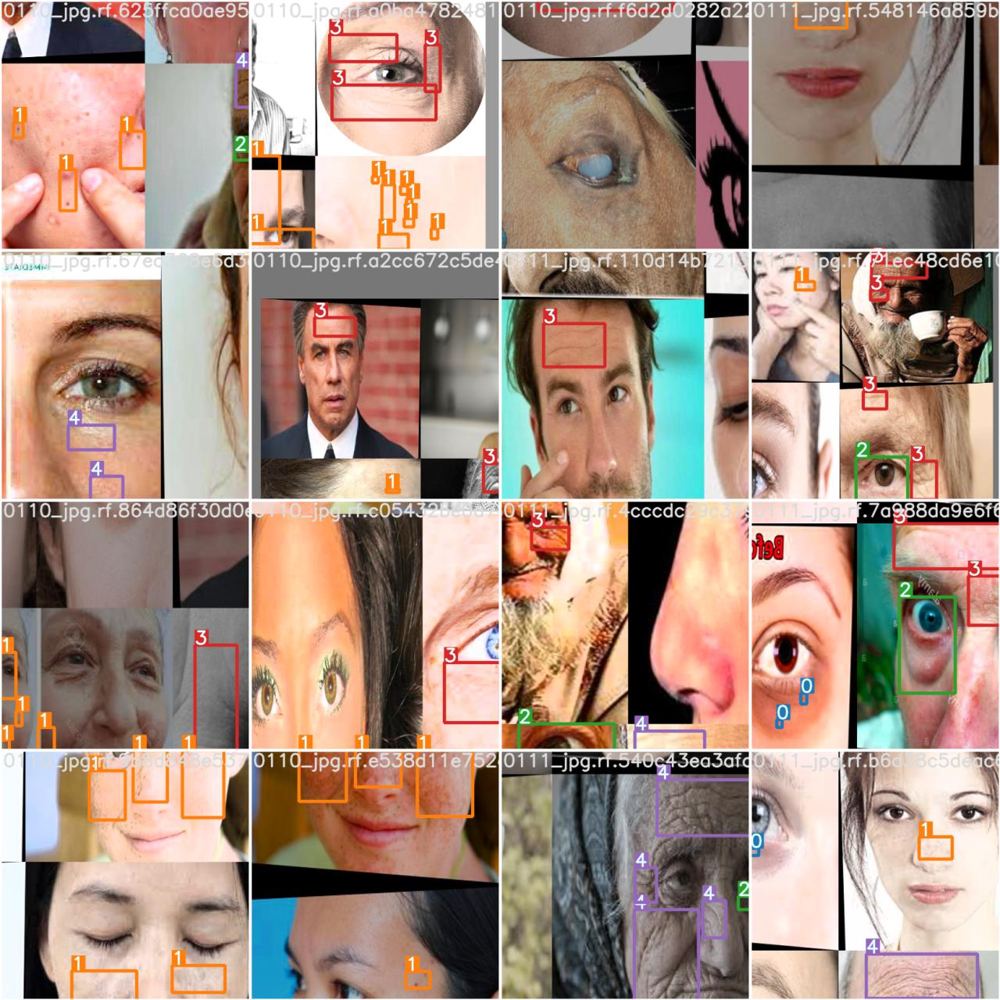

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./runs/train/yolov5s_results2/train_batch0.jpg', width=900)

###Run inference with trained model###

In [ ]:
%ls runs/

train/


In [ ]:
pwd

'/content/Age_sd_m/yolov5'

In [42]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [43]:

!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../train/images/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../train/images/', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7257306 parameters, 0 gradients, 16.8 GFLOPS
image 1/705 /content/Age_sd_m/yolov5/../train/images/0110_jpg.rf.625ffca0ae954dbd641899d1361956e6.jpg: 416x416 Done. (

# Path for the next cell need  to be given as in the last line of previous cell(runs/detect/exp5)

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('./runs/detect/exp5/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# NOTE : It's optional to export
##exporting the model to specified destination here to Age_sd_m as Exported_yolov5

In [ ]:
%cp ./runs/train/yolov5s_results/weights/best.pt /content/Age_sd_m/Exported_yolov5